# $(3)$ Data Analysis notebook only for paris 2020-09-01 to 2021-10-31.csv  (the new weather dataset we found) 

### Summary:
- 0) Why do we want to work with this new dataset ?
- 1) A first look at our dataset with ydata-profile
        - Quick discovery of the dataset with ydata_profiling package
- 2) Visualization of our dataset
        - Discovery of our dataset
        - Do some variables have repetition ? What about the uniqueness ? What about the missing values ?
        - What about the outliers ?
        - Data visualization
- 3) Deal with highly correlated variables
        - Reduction of dimentionality with a correlation matrix
- 4) Why we wanted to create (again) another weather dataset ?
        - All the changes we made to have scaled_weather_data
- 5) References

-----------------------------------------------------------------------------------------------

We begin by importing the necessary packages

In [15]:
import numpy as np
import pandas as pd
import ydata_profiling
import folium
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from pandas_profiling import ProfileReport


-----------------------------------------------------------------------------------------------
#### 0) Why do we want to work with this new dataset ?


With the initial external_data,csv we encountered a limitation with the granularity of the date column in our initial weather dataset. The data was aggregated in 3-hour intervals, which introduced a level of imprecision not conducive to our analysis, particularly when aligning it with other datasets that were recorded on an hourly basis. This discrepancy in data resolution could potentially lead to misaligned insights and, subsequently, less accurate predictions.

To mitigate this issue, we sought out a new weather dataset with a finer granularity, aligning the temporal resolution with our existing datasets. We found  the "paris 2020-09-01 to 2021-10-31.csv" dataset, which offers hourly data points. This enhanced granularity allows for a more precise and detailed analysis, enabling us to synchronize our weather data seamlessly with other hourly datasets.

The transition to a dataset with a matching temporal resolution is pivotal for our predictive models, as it ensures consistency across different data sources and allows for a more nuanced understanding of the variables at play. The hourly granularity of the new dataset renders it more adaptable and representative of the nuances within a given day, which is crucial for the accuracy of time-sensitive predictions.

-----------------------------------------------------------------------------------------------
#### 1) A first look at our dataset with ydata-profile

- > Quick discovery of the dataset with ydata_profiling package

In [16]:
#Load the external  dataset
data_paris_weather = pd.read_csv("../data/paris 2020-09-01 to 2021-10-31.csv")

The below report sums up key elements we need to know for external data

In [17]:
# Generate a minimal profile report
profile = ProfileReport(data_paris_weather)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

-----------------------------------------------------------------------------------------------
#### 2) Visualization of our dataset

- > Discovery of our dataset

In [18]:
data_paris_weather.head()

,name,datetime,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,...,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations
0,paris,2020-09-01T00:00:00,14.4,14.4,9.1,70.52,0.0,0,NaN,0.0,...,1020.5,33.3,27.8,0.0,0.0,0,NaN,Partially cloudy,partly-cloudy-night,"07149099999,07156099999,07146099999,0715709999..."
1,paris,2020-09-01T01:00:00,13.8,13.8,9.3,74.22,0.0,0,NaN,0.0,...,1020.5,10.0,27.6,0.0,0.0,0,NaN,Clear,clear-night,"07149099999,07156099999,07146099999,0715709999..."
2,paris,2020-09-01T02:00:00,13.3,13.3,9.4,77.67,0.0,0,NaN,0.0,...,1020.4,10.0,26.4,0.0,0.0,0,NaN,Clear,clear-night,"07149099999,07156099999,07146099999,0715709999..."
3,paris,2020-09-01T03:00:00,12.9,12.9,9.4,79.13,0.0,0,NaN,0.0,...,1020.1,10.0,26.6,0.0,0.0,0,NaN,Clear,clear-night,"07149099999,07156099999,07146099999,0715709999..."
4,paris,2020-09-01T04:00:00,12.4,12.4,9.2,80.98,0.0,0,NaN,0.0,...,1019.9,54.0,25.7,0.0,0.0,0,NaN,Partially cloudy,partly-cloudy-night,"07149099999,07156099999,07146099999,0715709999..."


In [19]:
data_paris_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10225 entries, 0 to 10224
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              10225 non-null  object 
 1   datetime          10225 non-null  object 
 2   temp              10225 non-null  float64
 3   feelslike         10225 non-null  float64
 4   dew               10225 non-null  float64
 5   humidity          10225 non-null  float64
 6   precip            10225 non-null  float64
 7   precipprob        10225 non-null  int64  
 8   preciptype        1432 non-null   object 
 9   snow              10217 non-null  float64
 10  snowdepth         10217 non-null  float64
 11  windgust          10097 non-null  float64
 12  windspeed         10225 non-null  float64
 13  winddir           10225 non-null  float64
 14  sealevelpressure  10098 non-null  float64
 15  cloudcover        10225 non-null  float64
 16  visibility        10217 non-null  float6

- > Do some variables have repetition ? What about the uniqueness ? What about the missing values ?

We see a lot of missing values...

In [20]:
# Calculate the percentage of missing values in each column
missing_values_percentage = (data_paris_weather.isnull().sum() / len(data_paris_weather)) * 100

# Filter to show only columns with missing values
missing_values_percentage = missing_values_percentage[missing_values_percentage > 0]

# Display the missing values as a percentage in a formatted table
print(missing_values_percentage.to_frame('Percentage of Missing Values'))


                  Percentage of Missing Values
preciptype                           85.995110
snow                                  0.078240
snowdepth                             0.078240
windgust                              1.251834
sealevelpressure                      1.242054
visibility                            0.078240
severerisk                          100.000000


What should we do with these missing values ? Replace them by their mean ? Delete them ? We made the choice to not keep the variables with missing values

We made the choice to remove all these columns in our new scaled_weather_data.csv (as we will below, they don't play an important role in the final predicition and some are too correlated with other variables)

Do some variables have repetitions ? How about the uniqueness ?

In [21]:
data_paris_weather.nunique(axis=0)

name                    2
datetime            10223
temp                  365
feelslike             428
dew                   308
humidity             4760
precip                613
precipprob              2
preciptype              3
snow                    2
snowdepth              25
windgust              626
windspeed             323
winddir               381
sealevelpressure      571
cloudcover            755
visibility            307
solarradiation       1007
solarenergy            36
uvindex                11
severerisk              0
conditions              9
icon                    8
stations               60
dtype: int64

> What about the outliers ?

In [22]:
# Select only numerical columns for outlier visualization
numerical_columns = data_paris_weather.select_dtypes(include=['float64', 'int64'])

total_rows = len(data_paris_weather)

for column in numerical_columns:
    Q1 = data_paris_weather[column].quantile(0.25)
    Q3 = data_paris_weather[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = data_paris_weather[(data_paris_weather[column] < lower_bound) | (data_paris_weather[column] > upper_bound)]
    num_outliers = len(outliers)
    percentage_outliers = (num_outliers / total_rows) * 100

    print(f'{column} - Outliers: {num_outliers} ({percentage_outliers:.2f}%)')


temp - Outliers: 18 (0.18%)
feelslike - Outliers: 32 (0.31%)
dew - Outliers: 57 (0.56%)
humidity - Outliers: 15 (0.15%)
precip - Outliers: 1432 (14.00%)
precipprob - Outliers: 1432 (14.00%)
snow - Outliers: 1 (0.01%)
snowdepth - Outliers: 24 (0.23%)
windgust - Outliers: 158 (1.55%)
windspeed - Outliers: 123 (1.20%)
winddir - Outliers: 0 (0.00%)
sealevelpressure - Outliers: 275 (2.69%)
cloudcover - Outliers: 0 (0.00%)
visibility - Outliers: 587 (5.74%)
solarradiation - Outliers: 1055 (10.32%)
solarenergy - Outliers: 1001 (9.79%)
uvindex - Outliers: 591 (5.78%)
severerisk - Outliers: 0 (0.00%)


- > Data visualization


Let's visualize a little bit our variables and especially the temperature in each station :

/var/folders/m1/k7ywl20s5t90qkylbxspkw080000gn/T/ipykernel_49339/121220059.py:28: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


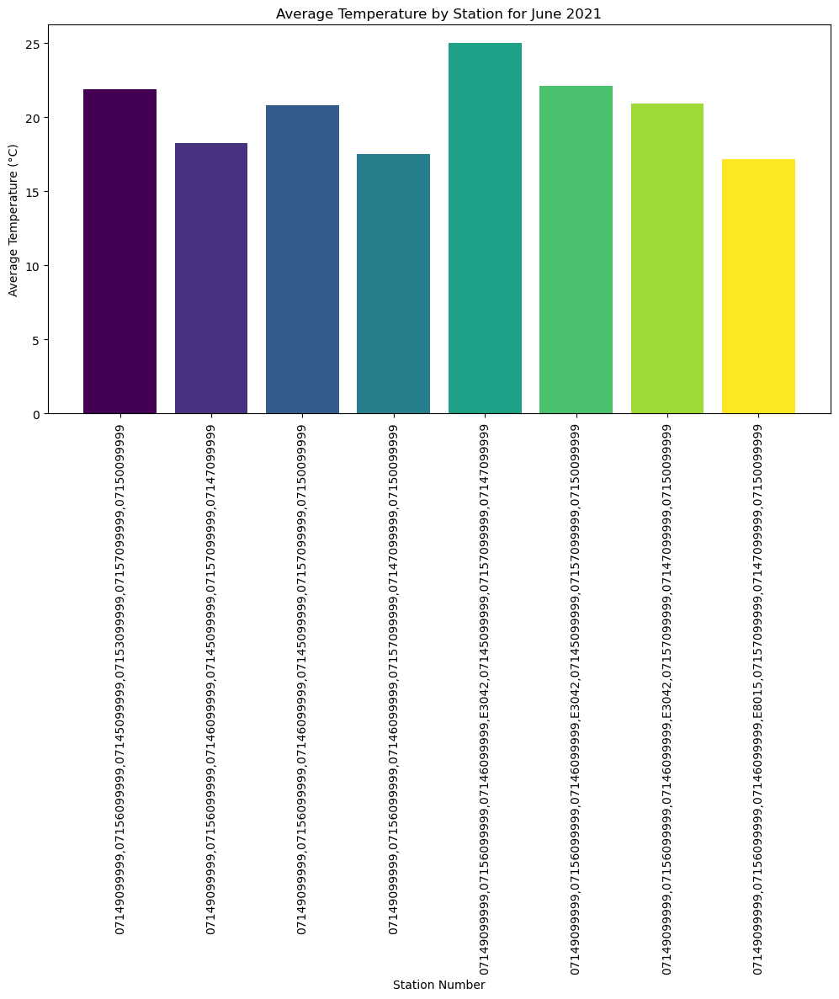

In [23]:
# Parse the 'datetime' to datetime objects for easier manipulation
data_paris_weather['datetime'] = pd.to_datetime(data_paris_weather['datetime'])

# We will now filter for data from June 2021
data_june_2021 = data_paris_weather[(data_paris_weather['datetime'] >= '2021-06-01') & 
                                    (data_paris_weather['datetime'] < '2021-07-01')]

# If 'stations' contains multiple station identifiers, we would need to split and explode the DataFrame
# This code assumes it's just one station identifier per record

# Calculate the average temperature for each station during June 2021
average_temps_per_station_june_2021 = data_june_2021.groupby('stations')['temp'].mean()

# Create the bar plot for June 2021
plt.figure(figsize=(12, 6))  # Adjust the size as needed
colors = plt.cm.viridis(np.linspace(0, 1, len(average_temps_per_station_june_2021)))
plt.bar(average_temps_per_station_june_2021.index, average_temps_per_station_june_2021, color=colors)

# Add titles and labels
plt.title('Average Temperature by Station for June 2021')
plt.xlabel('Station Number')
plt.ylabel('Average Temperature (°C)')

# Rotate the x-axis labels for better readability if needed
plt.xticks(rotation=90)

# Adjust the layout
plt.tight_layout()

# Display the plot
plt.show()



The histogram displayed represents the average temperature recorded at various stations for the month of June 2021. Each bar corresponds to a unique station, identified by its station number along the x-axis. The y-axis indicates the average temperature in degrees Celsius measured at each station during June.

We observe a range of average temperatures across the stations. Most stations exhibit average temperatures in the mid-range (~21C), with some variation that could be influenced by their geographical location, urban density, or other microclimatic factors. This histogram highlights the role played by the Temperature as expected when it comes to predicting the log(bike_count)

Let's get deeper into the Temperature variable, as we will see when modelling, this variable plays an important role in our final prediciton. Let's draw some boxplots.

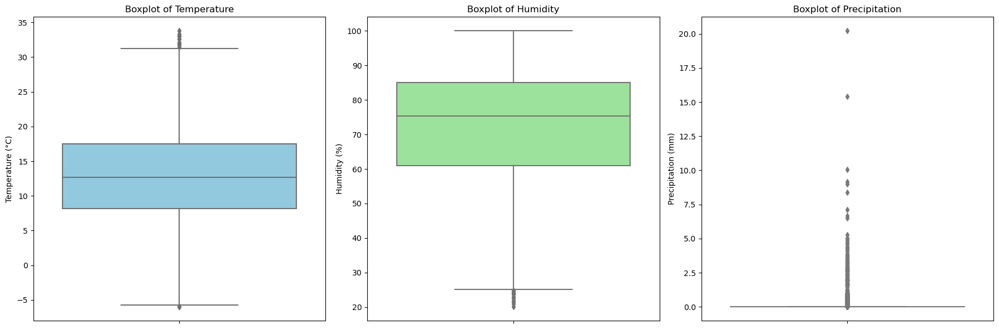

In [24]:
# Set up the matplotlib figure with 3 subplots in one row
fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # Adjust the size as needed

# Plot the boxplot for the 'temp' variable
sns.boxplot(ax=axes[0], data=data_paris_weather, y='temp', color='skyblue')
axes[0].set_title('Boxplot of Temperature')
axes[0].set_ylabel('Temperature (°C)')

# Plot the boxplot for the 'humidity' variable
sns.boxplot(ax=axes[1], data=data_paris_weather, y='humidity', color='lightgreen')
axes[1].set_title('Boxplot of Humidity')
axes[1].set_ylabel('Humidity (%)')

# Plot the boxplot for the 'precip' variable
sns.boxplot(ax=axes[2], data=data_paris_weather, y='precip', color='lightblue')
axes[2].set_title('Boxplot of Precipitation')
axes[2].set_ylabel('Precipitation (mm)')

# Display the plots
plt.tight_layout()
plt.show()


The series of three boxplots displayed represent the distributions of temperature, humidity, and precipitation respectively. Each boxplot offers a visual summary of one of the meteorological variables, detailing their spread and identifying any potential outliers.

1. **Temperature Boxplot (left)**: This boxplot, shaded in a calm blue, shows the central tendency and dispersion of temperature values. The central line in the box represents the median temperature. The length of the box indicates the interquartile range (IQR), giving insight into the middle 50% of the data. The "whiskers" extend to the minimum and maximum values within 1.5 times the IQR from the lower and upper quartiles, respectively. Points below and above the whiskers are considered outliers, and here we see a few, indicating temperatures that are unusually low for this dataset.

2. **Humidity Boxplot (center)**: The green boxplot displays the distribution of humidity percentages. Similar to the temperature plot, the median is marked by the line within the box, and the IQR is represented by the box's length. The humidity data appears to be fairly symmetrical with a few outliers on the lower end, suggesting instances of particularly dry conditions.

3. **Precipitation Boxplot (right)**: The precipitation boxplot, in a lighter shade, highlights the amount of precipitation. The data shows a larger number of outliers above the upper whisker, which suggests sporadic instances of heavy rainfall. The median is close to the lower quartile, indicating that most of the data points are skewed towards lower precipitation values, with most days having little to no rainfall.

THESE BOXPLOT ALSO HIGHLIGHT THE FACT THAT WE DON'T HAVE THAT MUCH OUTLIERS SO WE WILL KEEP THEM.

-----------------------------------------------------------------------------------------------
#### 3) Deal with highly correlated variables (correlation matrix, PCA)


- > Reduction of dimentionality with a correlation matrix

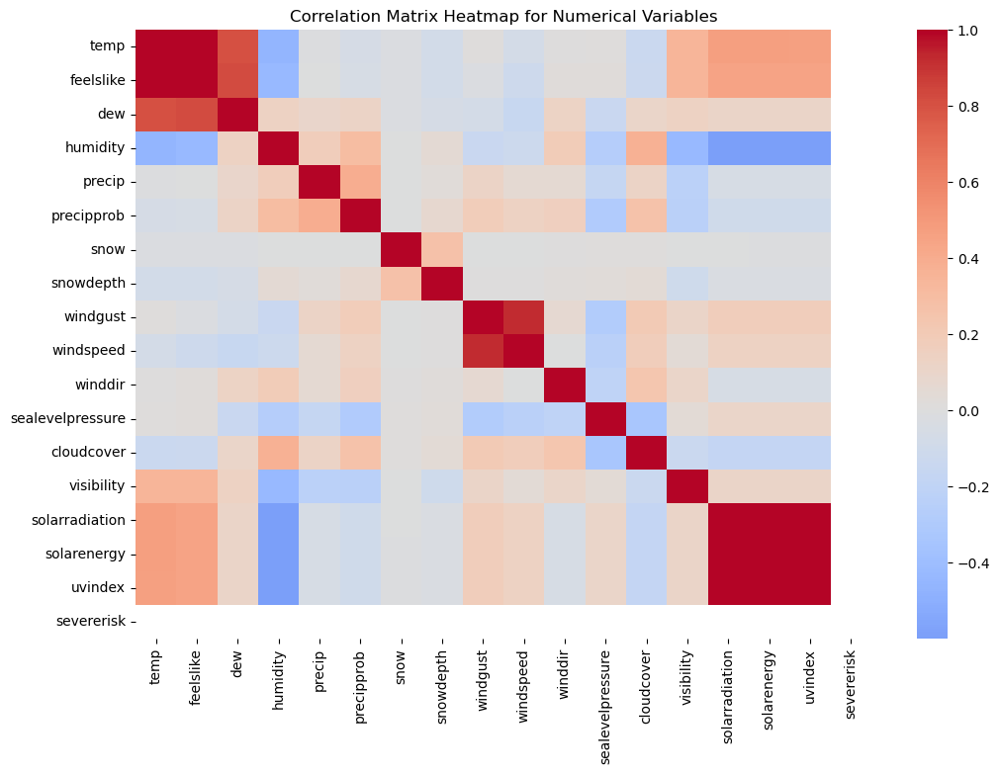

In [25]:
# Filter the DataFrame to include only float or int types
numerical_data_paris_weather = data_paris_weather.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix for numerical variables only
correlation_matrix_numerical = numerical_data_paris_weather.corr()

# Plotting the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix_numerical, cmap='coolwarm', center=0)
plt.title('Correlation Matrix Heatmap for Numerical Variables')
plt.show()


The correlation matrix heatmap provided offers a visual representation of the relationships between various meteorological variables. Notably, certain variables such as 'solarradiation' and 'uvindex' exhibit a high degree of correlation. This is expected as solar radiation intensity is directly related to the potential for skin-damaging ultraviolet radiation.

Highly correlated variables can contribute to redundancy in a dataset, and in the context of machine learning models, they can increase the risk of overfitting. Overfitting occurs when a model learns not only the underlying patterns but also the noise in the training data, resulting in poor generalization to new, unseen data.

To mitigate the risk of overfitting and to simplify the model, we have chosen to reduce the dimensionality in our new dataset, `scaled_weather_data.csv`. By removing or combining highly correlated variables, we can improve the model's ability to generalize while maintaining the integrity and interpretability of the model's predictions. This step is crucial in the preprocessing phase to ensure that the model remains robust and performs well on both the training data and any future data it encounters.

-----------------------------------------------------------------------------------------------
#### 4) Why we wanted to create (again) another weather dataset ? (All the changes we made to have scaled_weather_data ) (see the weater date preparation.ipynb)

The reasons for creating `scaled_weather_data.csv` were:

- **Improved Model Performance**: By ensuring that all features are on the same scale, we facilitate better convergence during the training of predictive models.

- **Reduced Complexity**: By removing highly correlated variables, we reduce the complexity of the model, which can improve computational efficiency and model interpretability.

- **Enhanced Generalization**: With a cleaner, more concise dataset, we enhance the model's ability to generalize to unseen data, thus improving its predictive performance on new data points.


- > All the changes we made to have scaled_weather_data

To transform our dataset from its original form to `scaled_weather_data.csv`, we performed several steps to clean, preprocess, and scale the data. The goal was to create a dataset better suited for predictive modeling that would avoid potential pitfalls like overfitting. Here are the changes made :

1. **Date Parsing and Range Checking**: We loaded the dataset into a DataFrame and converted the 'datetime' column into Pandas datetime objects for easier manipulation. We then created a complete date range to check for missing datetime values.

2. **Missing Date Handling**: We identified and imputed missing datetime values. For example, we duplicated data from '2021-03-28T03:00:00.000000' and adjusted its timestamp to '2021-03-28 02:00:00' to fill a gap due to daylight saving time adjustments.

3. **Data Cleaning**: We applied a numeric conversion to the entire DataFrame to ensure all possible numeric types were appropriately typed. We removed any duplicate rows based on the 'datetime' column to maintain data integrity.

4. **Feature Selection**: We dropped several columns such as 'name', 'preciptype', 'windgust', and others that were deemed irrelevant or redundant. This helped in reducing the dataset's dimensionality, which is crucial in preventing models from learning noise in the data (overfitting).

5. **Normalization**: We selected only the numerical features and applied a MinMaxScaler to normalize these features. Normalization ensures that each feature contributes proportionately to the final model.

6. **Merging and Exporting**: We merged the scaled numeric features back with the 'datetime' column and exported this cleaned and scaled dataset to `scaled_weather_data.csv`.

These steps collectively transformed the dataset into a form that is more amenable to the predictive modeling tasks we aim to perform.

Our new scaled_weather_data.csv looks like this now:

In [26]:
data_paris_weather_new = pd.read_csv("../data/scaled_weather_data.csv")
data_paris_weather_new.head()

,datetime,temp,humidity,precip,precipprob,windspeed,cloudcover
0,2020-09-01 00:00:00,0.512563,0.631085,0.0,0.0,0.150000,0.333
1,2020-09-01 01:00:00,0.497487,0.677387,0.0,0.0,0.152174,0.100
2,2020-09-01 02:00:00,0.484925,0.720561,0.0,0.0,0.143478,0.100
3,2020-09-01 03:00:00,0.474874,0.738831,0.0,0.0,0.082609,0.100
4,2020-09-01 04:00:00,0.462312,0.761982,0.0,0.0,0.071739,0.540


In [27]:
data_paris_weather_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10222 non-null  object 
 1   temp        10222 non-null  float64
 2   humidity    10222 non-null  float64
 3   precip      10222 non-null  float64
 4   precipprob  10222 non-null  float64
 5   windspeed   10222 non-null  float64
 6   cloudcover  10222 non-null  float64
dtypes: float64(6), object(1)
memory usage: 559.1+ KB


-----------------------------------------------------------------------------------------------
#### 5) References

https://www.visualcrossing.com/weather-data 

("With Visual Crossing Weather, we are proud to give back to the Open Source community by making high-quality forecast and historical weather data available to your projects at no cost to you and in many cases at no cost to your users as well." )